# 기본 세팅

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import json

plt.style.use('seaborn-v0_8-darkgrid')

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

# Time Series
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima

import torch
import torch.nn as nn
import torch.nn.functional as F

# Metrics
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

import pprint

import plotly.express as px
import plotly.graph_objects as go

In [2]:
from matplotlib.pylab import rcParams
%matplotlib inline

In [3]:
TEST_DATA_PATH = '../data/origin/test/'
TRAIN_DATA_PATH = '../data/origin/train/'

# instead of weather_station_to_county_mapping.csv, use fabiendaniels-mapping-locations-and-county-codes
# https://www.kaggle.com/datasets/michaelo/fabiendaniels-mapping-locations-and-county-codes/data
county_mapper = '../data/origin/county_lon_lats.csv'

test_csv = f'{TEST_DATA_PATH}test.csv'
test_client_csv = f'{TEST_DATA_PATH}client.csv'
test_electricity_prices_csv = f'{TEST_DATA_PATH}electricity_prices.csv'
test_forecast_weather_csv = f'{TEST_DATA_PATH}forecast_weather.csv'
test_gas_prices_csv = f'{TEST_DATA_PATH}gas_prices.csv'
test_historical_weather_csv = f'{TEST_DATA_PATH}historical_weather.csv'
# test_weather_station_to_county_mapping_csv = f'{TEST_DATA_PATH}weather_station_to_county_mapping.csv'
# test_county_id_to_name_map_json = f'{TEST_DATA_PATH}county_id_to_name_map.json'

train_csv = f'{TRAIN_DATA_PATH}train.csv'
train_client_csv = f'{TRAIN_DATA_PATH}client.csv'
train_electricity_prices_csv = f'{TRAIN_DATA_PATH}electricity_prices.csv'
train_forecast_weather_csv = f'{TRAIN_DATA_PATH}forecast_weather.csv'
train_gas_prices_csv = f'{TRAIN_DATA_PATH}gas_prices.csv'
train_historical_weather_csv = f'{TRAIN_DATA_PATH}historical_weather.csv'
# train_weather_station_to_county_mapping_csv = f'{TRAIN_DATA_PATH}weather_station_to_county_mapping.csv'
# train_county_id_to_name_map_json = f'{TRAIN_DATA_PATH}county_id_to_name_map.json'

In [4]:
# 머지 데이터를 불러옴 => 선 머지 후 분리?..
df_merge_train = pd.read_csv('../../data/features/train.csv')
df_merge_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2018352 entries, 0 to 2018351
Data columns (total 58 columns):
 #   Column                                    Dtype  
---  ------                                    -----  
 0   Unnamed: 0                                int64  
 1   county                                    int64  
 2   is_business                               int64  
 3   product_type                              int64  
 4   target                                    float64
 5   is_consumption                            int64  
 6   datetime                                  object 
 7   data_block_id                             int64  
 8   row_id                                    int64  
 9   prediction_unit_id                        int64  
 10  date                                      object 
 11  year                                      int64  
 12  quarter                                   int64  
 13  month                                     int64  
 14  we

In [5]:
# prediction_unit_id가 0인 것에 대해서만 진행하기로함
df_merge_train['prediction_unit_id'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68])

In [6]:
df_merge = df_merge_train[df_merge_train['prediction_unit_id'] == 0]

In [7]:
# 인덱스 값 불러온 것 삭제
df_merge.drop('Unnamed: 0', axis=1, inplace=True)
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30624 entries, 0 to 2018223
Data columns (total 57 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   county                                    30624 non-null  int64  
 1   is_business                               30624 non-null  int64  
 2   product_type                              30624 non-null  int64  
 3   target                                    30616 non-null  float64
 4   is_consumption                            30624 non-null  int64  
 5   datetime                                  30624 non-null  object 
 6   data_block_id                             30624 non-null  int64  
 7   row_id                                    30624 non-null  int64  
 8   prediction_unit_id                        30624 non-null  int64  
 9   date                                      30624 non-null  object 
 10  year                                 

/tmp/ipykernel_444797/4224447512.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merge.drop('Unnamed: 0', axis=1, inplace=True)


In [8]:
df_merge['datetime'] = pd.to_datetime(df_merge_train.datetime)
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30624 entries, 0 to 2018223
Data columns (total 57 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   county                                    30624 non-null  int64         
 1   is_business                               30624 non-null  int64         
 2   product_type                              30624 non-null  int64         
 3   target                                    30616 non-null  float64       
 4   is_consumption                            30624 non-null  int64         
 5   datetime                                  30624 non-null  datetime64[ns]
 6   data_block_id                             30624 non-null  int64         
 7   row_id                                    30624 non-null  int64         
 8   prediction_unit_id                        30624 non-null  int64         
 9   date                           

/tmp/ipykernel_444797/3037774180.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merge['datetime'] = pd.to_datetime(df_merge_train.datetime)


In [ ]:
# 그래프 그릴 때 응용하기
fig = go.Figure()

fig.add_trace(go.Scatter(x=weekly.index, y=weekly['temperature'], name='weekly'))
fig.add_trace(go.Scatter(x=hweekly.index, y=hweekly['temperature'], name='hweekly'))
fig.add_hline(y=meanTemp, line_dash='dot', annotation_text='Avg.forecast', annotation_position='bottom left')
fig.add_hline(y=hmeanTemp, line_dash='dot', annotation_text='Avg.historical', annotation_position='top left')

fig.update_layout(title='weekly Forecast_weather temperature')
fig.show()

In [9]:
df_merge.head(20)

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,date,...,snowfall_f_mean,total_precipitation_f_mean,forecast_date_electricity,euros_per_mwh_electricity,origin_date_electricity,forecast_date_gas,lowest_price_per_mwh_gas,highest_price_per_mwh_gas,origin_date_gas,mean_price_per_mwh_gas
0,0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
122,0,0,1,1.132,0,2021-09-01 01:00:00,0,122,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123,0,0,1,77.691,1,2021-09-01 01:00:00,0,123,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
244,0,0,1,0.490,0,2021-09-01 02:00:00,0,244,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
245,0,0,1,91.594,1,2021-09-01 02:00:00,0,245,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
366,0,0,1,0.496,0,2021-09-01 03:00:00,0,366,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
367,0,0,1,87.955,1,2021-09-01 03:00:00,0,367,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
488,0,0,1,0.149,0,2021-09-01 04:00:00,0,488,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
489,0,0,1,88.184,1,2021-09-01 04:00:00,0,489,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# 인덱스 초기화 하기
df_merge.reset_index(drop=True)

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,date,...,snowfall_f_mean,total_precipitation_f_mean,forecast_date_electricity,euros_per_mwh_electricity,origin_date_electricity,forecast_date_gas,lowest_price_per_mwh_gas,highest_price_per_mwh_gas,origin_date_gas,mean_price_per_mwh_gas
0,0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,0,1,1.132,0,2021-09-01 01:00:00,0,122,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,0,1,77.691,1,2021-09-01 01:00:00,0,123,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,0,1,0.490,0,2021-09-01 02:00:00,0,244,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30619,0,0,1,569.301,1,2023-05-31 21:00:00,637,2017963,0,2023-05-31,...,NaN,NaN,2023-05-30 21:00:00,82.10,2023-05-29 21:00:00,2023-05-30,29.0,34.0,2023-05-29,31.5
30620,0,0,1,5.086,0,2023-05-31 22:00:00,637,2018092,0,2023-05-31,...,NaN,NaN,2023-05-30 22:00:00,82.09,2023-05-29 22:00:00,2023-05-30,29.0,34.0,2023-05-29,31.5
30621,0,0,1,577.499,1,2023-05-31 22:00:00,637,2018093,0,2023-05-31,...,NaN,NaN,2023-05-30 22:00:00,82.09,2023-05-29 22:00:00,2023-05-30,29.0,34.0,2023-05-29,31.5
30622,0,0,1,2.921,0,2023-05-31 23:00:00,637,2018222,0,2023-05-31,...,NaN,NaN,2023-05-30 23:00:00,-1.29,2023-05-29 23:00:00,2023-05-30,29.0,34.0,2023-05-29,31.5


# 결측값

### 결측값이 너무 많은 Feature는 Drop하거나 다른 Feature로 고려하기

In [11]:
df_merge.isnull().sum()

county                                        0
is_business                                   0
product_type                                  0
target                                        8
is_consumption                                0
datetime                                      0
data_block_id                                 0
row_id                                        0
prediction_unit_id                            0
date                                          0
year                                          0
quarter                                       0
month                                         0
week                                          0
hour                                          0
day_of_year                                   0
day_of_month                                  0
day_of_week                                   0
eic_count_client                             96
installed_capacity_client                    96
date_client                             

In [12]:
# 이상한 값들 한번에 drop하기
df_merge.drop(['forecast_date_electricity', 'origin_date_electricity', 'forecast_date_gas', 'origin_date_gas'], axis=1, inplace=True)

/tmp/ipykernel_444797/2890476871.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merge.drop(['forecast_date_electricity', 'origin_date_electricity', 'forecast_date_gas', 'origin_date_gas'], axis=1, inplace=True)


In [13]:
df_merge.isnull().sum()

county                                        0
is_business                                   0
product_type                                  0
target                                        8
is_consumption                                0
datetime                                      0
data_block_id                                 0
row_id                                        0
prediction_unit_id                            0
date                                          0
year                                          0
quarter                                       0
month                                         0
week                                          0
hour                                          0
day_of_year                                   0
day_of_month                                  0
day_of_week                                   0
eic_count_client                             96
installed_capacity_client                    96
date_client                             

In [17]:
df_merge.set_index('datetime').groupby(pd.Grouper(freq='MS'))[['target']]

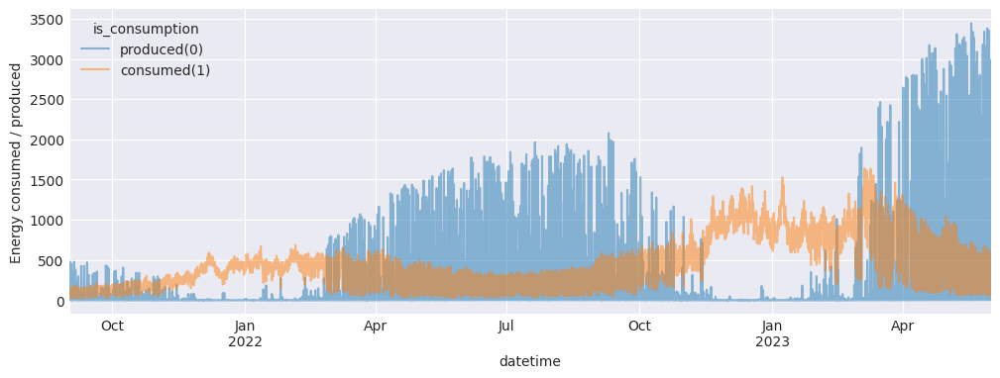

In [18]:
# Subplot하기 merge_train에서, datetime에 대한 전체 plot
merge_train = (
    df_merge.groupby(['datetime', 'is_consumption'])
    ['target'].mean()
    .unstack().rename({0: 'produced(0)', 1:'consumed(1)'}, axis=1)
)

fig, ax = plt.subplots(1, 1, figsize=(12, 4))
_ = merge_train.plot(ax=ax, alpha=0.5)
_ = ax.set_ylabel('Energy consumed / produced')


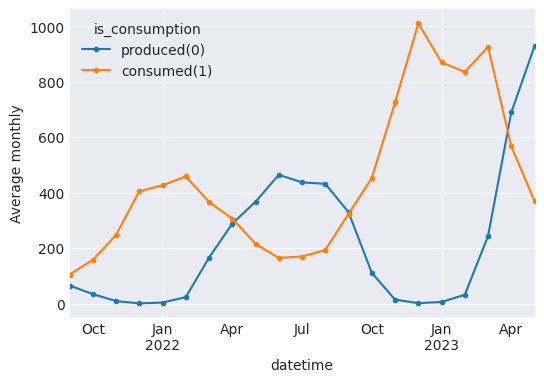

In [19]:
# 월별로 평균을 냈을 때, plot
fig,ax = plt.subplots(1,1,figsize=(6,4))
_ = merge_train.resample('M').mean().plot(ax=ax, marker='.')
_ = ax.set_ylabel('Average monthly')

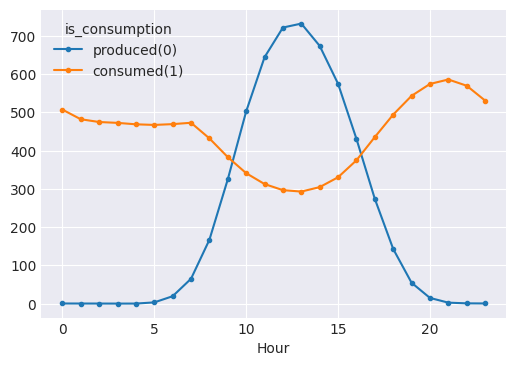

In [20]:
# 하루에서 평균을 낸것 시간대별 plot
fig,ax = plt.subplots(1,1,figsize=(6,4))
merge_train.groupby(merge_train.index.hour).mean().plot(ax=ax, marker='.')
_ = ax.set_xlabel('Hour')

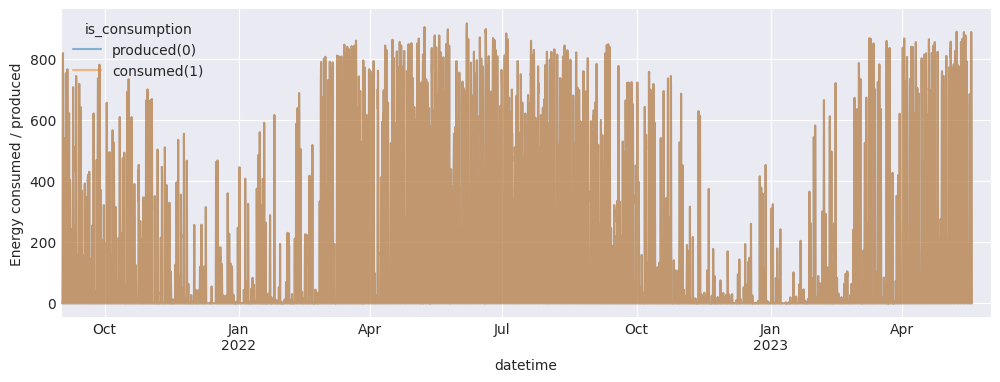

In [22]:
direct_solar = (
    df_merge.groupby(['datetime', 'is_consumption'])
    ['direct_solar_radiation_f_mean'].mean()
    .unstack().rename({0: 'produced(0)', 1:'consumed(1)'}, axis=1)
)

fig, ax = plt.subplots(1, 1, figsize=(12, 4))
_ = direct_solar.plot(ax=ax, alpha=0.5)
_ = ax.set_ylabel('Energy consumed / produced')


In [44]:
fig0 = go.Figure(data=[go.Scatter(x=df_merge['date'], y=df_merge['direct_solar_radiation_f_mean']),
                     go.Scatter(x=df_merge['date'], y=df_merge[df_merge['is_consumption'] == 0]['target'])])
fig0.show()

In [31]:
df_merge.reset_index(drop=True)

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,date,...,10_metre_u_wind_component_f_mean,10_metre_v_wind_component_f_mean,direct_solar_radiation_f_mean,surface_solar_radiation_downwards_f_mean,snowfall_f_mean,total_precipitation_f_mean,euros_per_mwh_electricity,lowest_price_per_mwh_gas,highest_price_per_mwh_gas,mean_price_per_mwh_gas
0,0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,0,1,1.132,0,2021-09-01 01:00:00,0,122,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,0,1,77.691,1,2021-09-01 01:00:00,0,123,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,0,1,0.490,0,2021-09-01 02:00:00,0,244,0,2021-09-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30619,0,0,1,569.301,1,2023-05-31 21:00:00,637,2017963,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,82.10,29.0,34.0,31.5
30620,0,0,1,5.086,0,2023-05-31 22:00:00,637,2018092,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,82.09,29.0,34.0,31.5
30621,0,0,1,577.499,1,2023-05-31 22:00:00,637,2018093,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,82.09,29.0,34.0,31.5
30622,0,0,1,2.921,0,2023-05-31 23:00:00,637,2018222,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.29,29.0,34.0,31.5


In [33]:
df_merge.tail(10)

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,date,...,10_metre_u_wind_component_f_mean,10_metre_v_wind_component_f_mean,direct_solar_radiation_f_mean,surface_solar_radiation_downwards_f_mean,snowfall_f_mean,total_precipitation_f_mean,euros_per_mwh_electricity,lowest_price_per_mwh_gas,highest_price_per_mwh_gas,mean_price_per_mwh_gas
2017702,0,0,1,439.610,0,2023-05-31 19:00:00,637,2017702,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,82.10,29.0,34.0,31.5
2017703,0,0,1,300.096,1,2023-05-31 19:00:00,637,2017703,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,82.10,29.0,34.0,31.5
2017832,0,0,1,120.856,0,2023-05-31 20:00:00,637,2017832,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,150.85,29.0,34.0,31.5
2017833,0,0,1,443.340,1,2023-05-31 20:00:00,637,2017833,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,150.85,29.0,34.0,31.5
2017962,0,0,1,22.428,0,2023-05-31 21:00:00,637,2017962,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,82.10,29.0,34.0,31.5
2017963,0,0,1,569.301,1,2023-05-31 21:00:00,637,2017963,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,82.10,29.0,34.0,31.5
2018092,0,0,1,5.086,0,2023-05-31 22:00:00,637,2018092,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,82.09,29.0,34.0,31.5
2018093,0,0,1,577.499,1,2023-05-31 22:00:00,637,2018093,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,82.09,29.0,34.0,31.5
2018222,0,0,1,2.921,0,2023-05-31 23:00:00,637,2018222,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.29,29.0,34.0,31.5
2018223,0,0,1,544.221,1,2023-05-31 23:00:00,637,2018223,0,2023-05-31,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.29,29.0,34.0,31.5


In [36]:
fig = go.Figure(data=go.Scatter(x=df_merge['date'], y=df_merge['target']))
fig.show()

In [37]:
df_consum0_target = df_merge[df_merge['is_consumption'] == 0]

In [42]:
fig2 = go.Figure(data=go.Scatter(x=df_consum0_target['date'], y=df_merge['target']))
fig2.update_traces(mode='lines')
fig2.show()

In [47]:
fig1 = px.line(df_merge, x='date', y=['direct_solar_radiation_f_mean', 'target'])
fig1.update_traces(mode='lines')
fig1.show()

### 결측값을 어떻게 채울지 결정

# 이상치

### Boxplot이나 수치를 보고, 엄청 튀는 값 있는지 확인하기 => 있으면 이유까지

In [ ]:
# describe를 통해서 수치확인

### 목적은 발표시에, 이상치 확인했다 라는 느낌이 들도록

### Scaling 후에도 튀는 값이 있는지 확인하기

# 상관 관계

### 변수간 상관관계 확인

### target(consumption, production)과 다른 변수와의 상관관계 확인

### 상관관계 중 절댓값으로 0.4넘는 Feature 확인하기

## 전체 Feature 실험 결과와, 선택 Feature 실험 결과에 대해서, ARIMA, ANN 값 비교하기 